<h1>GEO1001 HW2 <br/>
Louise Spekking 4256778<br/>
Michiel de Jong 4376978

In [3]:
import rasterio
import numpy as np
from rasterio.windows import Window
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors

import random
import matplotlib.colors as mc
import cmocean


Open 60m band files and read files. Convert the bands to float32 to avoid problems later on. 


In [4]:
band1_60 = rasterio.open('./GRANULE/L2A_T31UET_A025788_20200530T105134/IMG_DATA/R60m/T31UET_20200530T105031_B01_60m.jp2').read().astype('float32')
band2_60 = rasterio.open('./GRANULE/L2A_T31UET_A025788_20200530T105134/IMG_DATA/R60m/T31UET_20200530T105031_B02_60m.jp2').read().astype('float32')
band3_60 = rasterio.open('./GRANULE/L2A_T31UET_A025788_20200530T105134/IMG_DATA/R60m/T31UET_20200530T105031_B03_60m.jp2').read().astype('float32')
band4_60 = rasterio.open('./GRANULE/L2A_T31UET_A025788_20200530T105134/IMG_DATA/R60m/T31UET_20200530T105031_B04_60m.jp2').read().astype('float32')
band8_60 = rasterio.open('./GRANULE/L2A_T31UET_A025788_20200530T105134/IMG_DATA/R60m/T31UET_20200530T105031_B8A_60m.jp2').read().astype('float32')
band11_60 = rasterio.open('./GRANULE/L2A_T31UET_A025788_20200530T105134/IMG_DATA/R60m/T31UET_20200530T105031_B11_60m.jp2').read().astype('float32')
band12_60 = rasterio.open('./GRANULE/L2A_T31UET_A025788_20200530T105134/IMG_DATA/R60m/T31UET_20200530T105031_B12_60m.jp2').read().astype('float32')

Convert the files from n-dimensional arrays to flat arrays, so we can stack them, and preprocess them for the clustering. 

In [15]:
blue_flat = band2_60.flatten()
green_flat = band3_60.flatten()
red_flat = band4_60.flatten()
NIR = band8_60.flatten()
coastal_flat = band1_60.flatten()
swir1_flat = band11_60.flatten()
swir2_flat = band12_60.flatten()

Stack the different bands combinations. First we decided to look at:
* Red/Green/Blue. Natural light part of the spectrum, useful for true color representations of satellite data.
* Near Infrared/Red/Green. The combination of these bands is known as the Colored infrared, which can be useful to show the state of vegetation, amongst other things. 
* Red/Green/Coastal. The combination of these bands is used to look at coastal areas. In these images, you should be able to see silt deposits near the coastline for instance. 
* Short-Wave Infrared/Near Infrared/Blue. This band combination is also used to distinguish between built up areas and vegetation. It is useful to detect dense vegetation. 

In [17]:
stacked3 = np.vstack((red_flat, green_flat, blue_flat)).T
stacked3_norm = np.vstack((redn, greenn, bluen)).T
stacked_vegetation = np.vstack((NIR, red_flat, green_flat)).T
stacked_bathymetric = np.vstack((red_flat, green_flat, coastal_flat)).T
stacked_agriculture = np.vstack((swir1_flat, NIR, blue_flat)).T

A small function to normalize arrays, should we desire to do so. 

In [11]:
def normalize(array):
    array_min, array_max = array.min(), array.max()
    return ((array - array_min)/(array_max - array_min))

To first get a glimpse of the data we have, we have decided to plot a true color composite of the Sentinel-2 data. Although we can make out the outline of the Dutch coastline, it is hard do make out specific details, and the image is rather dark. Hopefully, some band combinations will yield more clear visualizations. 

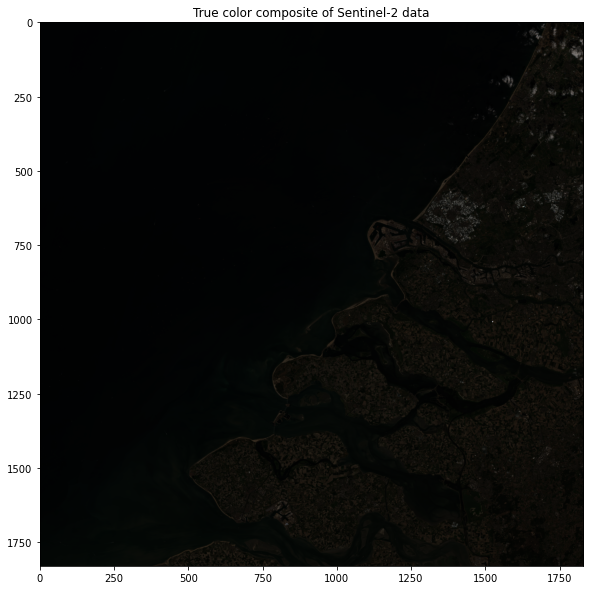

In [12]:
blue_plot = np.array(band2_60[0])
green_plot = np.array(band3_60[0])
red_plot = np.array(band4_60[0])
nir_plot = np.array(band8_60[0])
bluen = normalize(blue_plot)
greenn = normalize(green_plot)
redn = normalize(red_plot)
rgb = np.dstack((redn, greenn, bluen))
plt.figure(figsize=(10,10))
plt.title('True color composite of Sentinel-2 data')
plt.imshow(rgb)

The KMeans cluster needs to be initialized. To make sure that it starts at a random point, a random integer is generated. 

In [19]:
random = random.randint(1,3000000)

The first set of *k*-means clustering is done with 4 clusters. After some iteration, we found that for these band combinations, 4 clusters balances well between to much noise, and too little information. For the coastal stack and the agricultural stack, 6 bands were chosen after some iteration. Lastly, we added two classifications with only 2 clusters that still yielded some acceptable visualisations. 

In [20]:
clustering4 = KMeans(n_clusters=4, random_state=random)
cluster2 = clustering4.fit_predict(stacked3)
cluster3 = clustering4.fit_predict(stacked_vegetation)

In [22]:
clustering6 = KMeans(n_clusters=6, random_state = random)
cluster4 = clustering6.fit_predict(stacked_bathymetric)
cluster5 = clustering6.fit_predict(stacked_agriculture)

In [23]:
clustering2 = KMeans(n_clusters=2, random_state = random)
cluster6 = clustering2.fit_predict(stacked_vegetation)
cluster7 = clustering2.fit_predict(stacked_agriculture)


After the *k*-means clustering, we decided that we could also pursue the DBScan algorithm, to see if it would yield better (or worse) results. When initialising the DBScan, two parameters have to be input for the model $\epsilon$ and the minimum number of samples per cluster. We found a method  to determine the $\epsilon$ value: using a nearest neighbour graph. When plotting the nearest neighbour graph, the a good $\epsilon$ value will be where the plot curves upward the most. In these 3 cases, it was 4, 7.5 and 0.0003 respectively. 

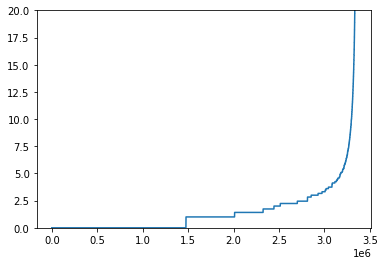

In [67]:
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(stacked3)
distances, indices = nbrs.kneighbors(stacked3)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
#axes.set_ylim([0,500])
plt.ylim(0,20)
plt.plot(distances)

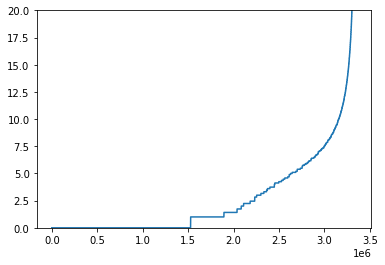

In [72]:
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(stacked_vegetation)
distances, indices = nbrs.kneighbors(stacked_vegetation)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
#axes.set_ylim([0,500])
plt.ylim(0,20)
plt.plot(distances)

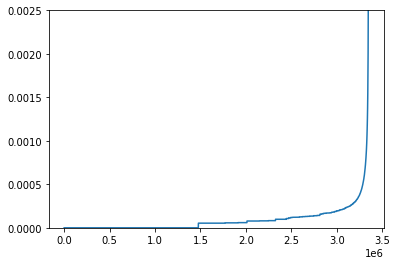

In [109]:
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(stacked3_norm)
distances, indices = nbrs.kneighbors(stacked3_norm)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
#axes.set_ylim([0,500])
plt.ylim(0,0.0025)
plt.plot(distances)

Initialising the DBScan, is similar to the *k*-means method. After determining the $\epsilon$ value, and arbitrarily choosing the minimum number of samples as 4, we tried out the DBScan algorithm. Note, the `<dbscan2 = DBSCAN(eps=7.5, min_samples = 4)>` combination did not run to completion, because every time the kernel died and the result was not yet done. Perhaps this is because of a too high $\epsilon$ value. 

In [68]:
dbscan = DBSCAN(eps=4, min_samples = 5)
cluster2_dbscan = dbscan.fit_predict(stacked3)


In [110]:
dbscan3 = DBSCAN(eps=0.0003, min_samples = 4)
cluster3_dbscan_norm = dbscan3.fit_predict(stacked3_norm)

To initialize the plots, the clusters have to be reshaped from a flattened array, back to a 2 dimensional array. 

In [26]:
plot_array_3 = np.reshape(cluster2, (len(band2_60[0]), len(band2_60[0])))
plot_array_4 = np.reshape(cluster3, (len(band2_60[0]), len(band2_60[0])))

plot_array_5 = np.reshape(cluster4, (len(band2_60[0]), len(band2_60[0])))
plot_array_6 = np.reshape(cluster5, (len(band2_60[0]), len(band2_60[0])))

plot_array_7 = np.reshape(cluster6, (len(band2_60[0]), len(band2_60[0])))
plot_array_8 = np.reshape(cluster7, (len(band2_60[0]), len(band2_60[0])))


In [112]:
plot_array_3_dbscan = np.reshape(cluster2_dbscan, (len(band2_60[0]), len(band2_60[0])))
plot_array_4_dbscan = np.reshape(cluster3_dbscan, (len(band2_60[0]), len(band2_60[0])))
plot_array_3_dbscan_norm = np.reshape(cluster3_dbscan_norm, (len(band2_60[0]), len(band2_60[0])))


In the plots below, we can see the results of the image classifiation using *k*-means clustering.\
On the first row, we see the classification of the RGB bands and the Colored IR. In the RGB image, we can see clearly the divide between land and sea, but even that fails in Zeeland, where the shallow delta confuses the clustering, and gives rise to islands that are not quite there. 

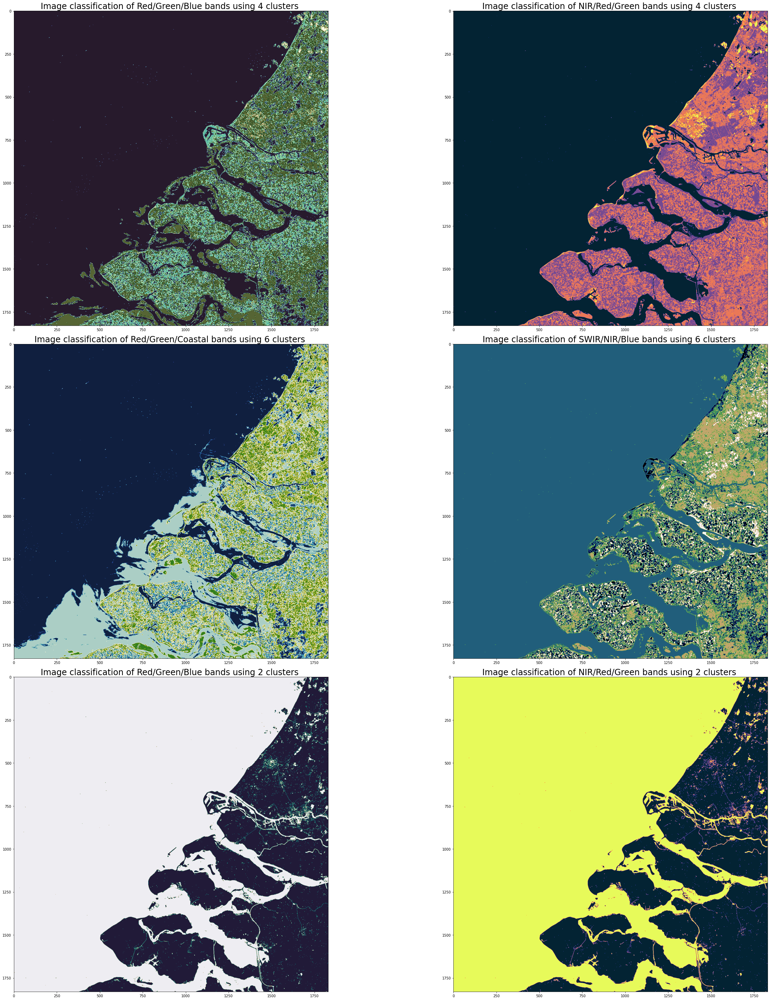

In [27]:
fig = plt.figure(figsize =(40,40))

ax1 = fig.add_subplot(321)
ax1.imshow(plot_array_3, cmap='cmo.topo')
ax1.set_title("Image classification of Red/Green/Blue bands using 4 clusters ",fontsize=24)

ax2 = fig.add_subplot(322)
ax2.imshow(plot_array_4, cmap='cmo.thermal')
ax2.set_title("Image classification of NIR/Red/Green bands using 4 clusters ",fontsize=24)

ax3 = fig.add_subplot(323)
ax3.imshow(plot_array_5, cmap='cmo.delta')
ax3.set_title("Image classification of Red/Green/Coastal bands using 6 clusters ",fontsize=24)

ax4 = fig.add_subplot(324)
ax4.imshow(plot_array_6, cmap='gist_earth')
ax4.set_title("Image classification of SWIR/NIR/Blue bands using 6 clusters ",fontsize=24)

ax5 = fig.add_subplot(325)
ax5.imshow(plot_array_7, cmap='cmo.rain')
ax5.set_title("Image classification of Red/Green/Blue bands using 2 clusters ",fontsize=24)

ax6 = fig.add_subplot(326)
ax6.imshow(plot_array_8, cmap='cmo.thermal')
ax6.set_title("Image classification of NIR/Red/Green bands using 2 clusters ",fontsize=24)


plt.tight_layout()

In [1]:
fig = plt.figure(figsize =(40,40))

ax1 = fig.add_subplot(121)
ax1.imshow(plot_array_3_dbscan, cmap='cmo.balance')
ax1.set_title("Image classification of Blue/Red/Green bands using DBScan ",fontsize=24)
ax2 = fig.add_subplot(122)
ax2.imshow(plot_array_3_dbscan_norm, cmap='cmo.balance')
ax2.set_title("Image classification of Blue/Red/Green (normed) bands using DBScan ",fontsize=24)

plt.tight_layout()

NameError: name 'plt' is not defined

In [15]:
# figuur makes no sense

#fig = plt.figure()
#ax = fig.add_subplot(111)
#ax.scatter(reshaped_60m[0], reshaped_60m[1])
#plt.show()

plot clusters in 3D 

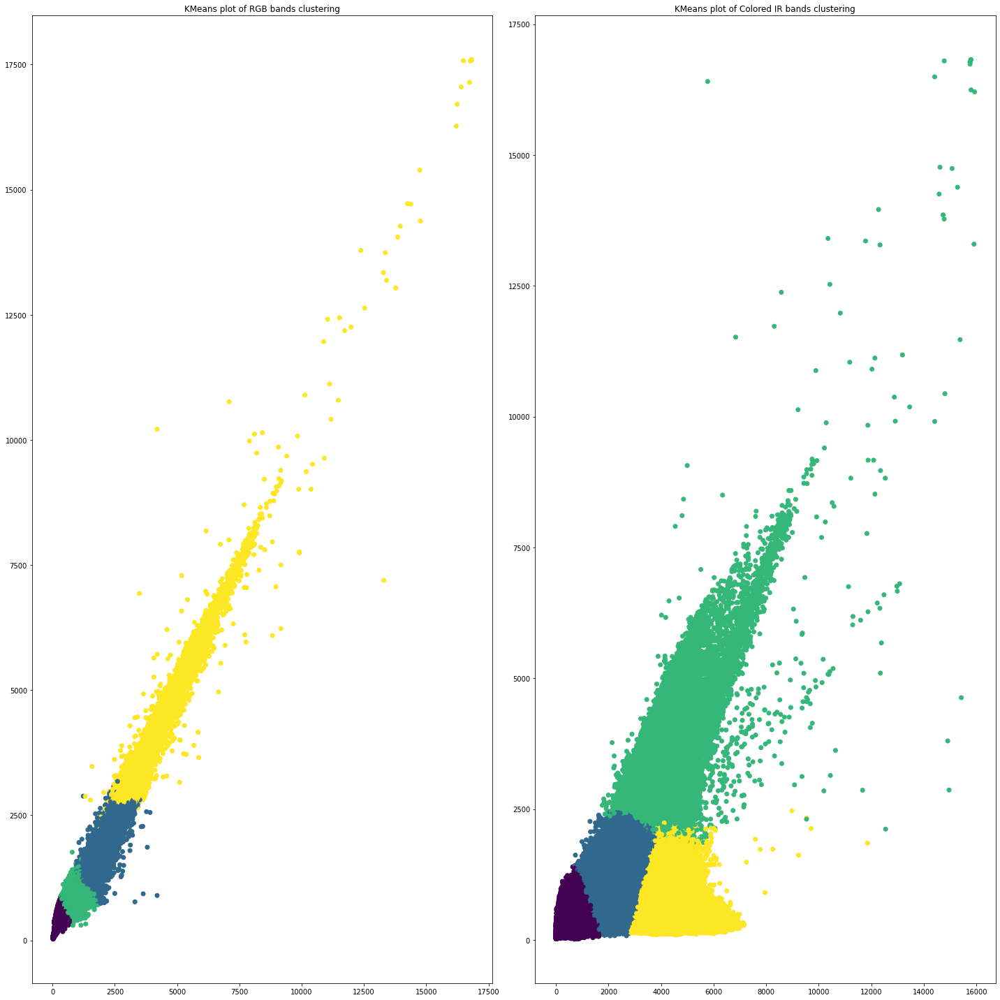

In [35]:
fig = plt.figure(figsize=(20,20))
ax1 = fig.add_subplot(121)
ax1.scatter(stacked3[:,0], stacked3[:,1],c=cluster2)
ax1.set_title('KMeans plot of RGB bands clustering')
ax2 = fig.add_subplot(122)
ax2.scatter(stacked_vegetation[:,0], stacked_vegetation[:,1],c=cluster3)
ax2.set_title('KMeans plot of Colored IR bands clustering')
plt.tight_layout()
plt.show()

open 10m band files

In [17]:
with rasterio.open('./GRANULE/L2A_T31UET_A025788_20200530T105134/IMG_DATA/R10m/T31UET_20200530T105031_B02_10m.jp2') as src:
    row, col = src.index(601200, 5773695)
    band2_10 = src.read(1, window=Window(row_off = row, col_off=col, height=500, width=700))

with rasterio.open('./GRANULE/L2A_T31UET_A025788_20200530T105134/IMG_DATA/R10m/T31UET_20200530T105031_B03_10m.jp2') as src:
    row, col = src.index(601200, 5773695)
    band3_10 = src.read(1, window=Window(row_off = row, col_off=col, height=500, width=700))

with rasterio.open('./GRANULE/L2A_T31UET_A025788_20200530T105134/IMG_DATA/R10m/T31UET_20200530T105031_B04_10m.jp2') as src:
    row, col = src.index(601200, 5773695)
    band4_10 = src.read(1, window=Window(row_off = row, col_off=col, height=500, width=700))

with rasterio.open('./GRANULE/L2A_T31UET_A025788_20200530T105134/IMG_DATA/R10m/T31UET_20200530T105031_B08_10m.jp2') as src:
    row, col = src.index(601200, 5773695)
    band8_10 = src.read(1, window=Window(row_off = row, col_off=col, height=500, width=700))

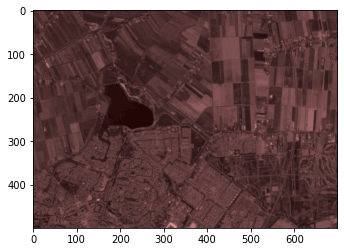

In [18]:
plt.imshow(band8_10, cmap = 'pink')
plt.imshow(band2_10, cmap = 'pink')
plt.imshow(band3_10, cmap = 'pink')
plt.imshow(band4_10, cmap = 'pink')
plt.show()

import modules

In [1]:
import rasterio
import numpy as np
from rasterio.windows import Window
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans, DBSCAN
import random
import matplotlib.colors as mc
import cmocean

open 60m band files and read files 


In [2]:
band2_60 = rasterio.open('./GRANULE/L2A_T31UET_A025788_20200530T105134/IMG_DATA/R60m/T31UET_20200530T105031_B02_60m.jp2').read().astype('float32')
band3_60 = rasterio.open('./GRANULE/L2A_T31UET_A025788_20200530T105134/IMG_DATA/R60m/T31UET_20200530T105031_B03_60m.jp2').read().astype('float32')
band4_60 = rasterio.open('./GRANULE/L2A_T31UET_A025788_20200530T105134/IMG_DATA/R60m/T31UET_20200530T105031_B04_60m.jp2').read().astype('float32')
band8_60 = rasterio.open('./GRANULE/L2A_T31UET_A025788_20200530T105134/IMG_DATA/R60m/T31UET_20200530T105031_B8A_60m.jp2').read().astype('float32')

flatten files 

In [3]:
blue_flat = band2_60.flatten()
green_flat = band3_60.flatten()
red_flat = band4_60.flatten()
NIR = band8_60.flatten()

stack files for visualisation

In [4]:
stacked2 = np.vstack((blue_flat, green_flat)).T
stacked3 = np.vstack((blue_flat, green_flat, red_flat)).T

create random state for clustering

In [7]:
random = random.randint(1,3000000)

KMeans clustering 

In [24]:
clustering = KMeans(n_clusters=2, random_state=random)
cluster1 = clustering.fit_predict(stacked2)
cluster2 = clustering.fit_predict(stacked3)


check shape of clusters 

In [ ]:
print('shape cluster 1', cluster1.shape)
print('shape cluster 2', cluster2.shape)

In [ ]:
plot_array_2 = np.reshape(cluster1, (len(band2_60[0]), len(band2_60[0])))
plot_array_3 = np.reshape(cluster2, (len(band2_60[0]), len(band2_60[0])))
#plot_array_4 = np.reshape(cluster2, (len(band2_60[0]), len(band2_60[0])))


In [ ]:
cmap = mc.LinearSegmentedColormap.from_list("", ['black', 'red', 'green', 'purple'])

fig , axes = plt.subplots(nrows = 1, ncols = 3, figsize=(20,5))
plt.sca(axes[0])
plt.imshow(plot_array_2, cmap=cmap)

plt.sca(axes[1])
plt.imshow(plot_array_3, cmap=cmap)

In [ ]:
# figuur makes no sense

#fig = plt.figure()
#ax = fig.add_subplot(111)
#ax.scatter(reshaped_60m[0], reshaped_60m[1])
#plt.show()

plot clusters in 3D 

In [ ]:
fig = plt.figure()
ax = fig.add_subplot(111)
ax.scatter(stacked2[:,0], stacked2[:,1])
plt.show()

open 10m band files

In [2]:
with rasterio.open('./GRANULE/L2A_T31UET_A025788_20200530T105134/IMG_DATA/R10m/T31UET_20200530T105031_B02_10m.jp2') as src:
    row, col = src.index(601200, 5773695)
    band2_10 = src.read(1, window=Window(row_off = row, col_off=col, height=500, width=700))

with rasterio.open('./GRANULE/L2A_T31UET_A025788_20200530T105134/IMG_DATA/R10m/T31UET_20200530T105031_B03_10m.jp2') as src:
    row, col = src.index(601200, 5773695)
    band3_10 = src.read(1, window=Window(row_off = row, col_off=col, height=500, width=700))

with rasterio.open('./GRANULE/L2A_T31UET_A025788_20200530T105134/IMG_DATA/R10m/T31UET_20200530T105031_B04_10m.jp2') as src:
    row, col = src.index(601200, 5773695)
    band4_10 = src.read(1, window=Window(row_off = row, col_off=col, height=500, width=700))

with rasterio.open('./GRANULE/L2A_T31UET_A025788_20200530T105134/IMG_DATA/R10m/T31UET_20200530T105031_B08_10m.jp2') as src:
    row, col = src.index(601200, 5773695)
    band8A_10 = src.read(1, window=Window(row_off = row, col_off=col, height=500, width=700))

flatten bands 

In [4]:
blue_10 = band2_10.flatten()
green_10 = band3_10.flatten()
red_10 = band4_10.flatten()
NIR_10 = band8A_10.flatten()

Stack files for visualization 

In [5]:
stackedBR_10 = np.vstack((blue_10, red_10)).T
stackedBGR_10 = np.vstack((blue_10, green_10, red_10)).T
stackedBGRNIR_10 = np.vstack((blue_10, green_10, red_10, NIR_10)).T
stackedvegetation_10 = np.vstack((NIR_10, red_10, green_10)).T

Clustering

In [8]:
#Two clusters

clustering_2 = KMeans(n_clusters=2, random_state=random)
clusterBR_10_2 = clustering_2.fit_predict(stackedBR_10)
clusterBGR_10_2 = clustering_2.fit_predict(stackedBGR_10)
clusterBGRNIR_10_2 = clustering_2.fit_predict(stackedBGRNIR_10)
cluster_veg_2 = clustering_2.fit_predict(stackedvegetation_10)


In [9]:
#Three cluster 

clustering_3 = KMeans(n_clusters=3, random_state=random)
clusterBR_10_3 = clustering_3.fit_predict(stackedBR_10)
clusterBGR_10_3 = clustering_3.fit_predict(stackedBGR_10)
clusterBGRNIR_10_3 = clustering_3.fit_predict(stackedBGRNIR_10)
cluster_veg_3 = clustering_3.fit_predict(stackedvegetation_10)

In [10]:
#Four clusters 

clustering_4 = KMeans(n_clusters=4, random_state=random)
clusterBR_10_4 = clustering_4.fit_predict(stackedBR_10)
clusterBGR_10_4 = clustering_4.fit_predict(stackedBGR_10)
clusterBGRNIR_10_4 = clustering_4.fit_predict(stackedBGRNIR_10)
cluster_veg_4 = clustering_4.fit_predict(stackedvegetation_10)

In [12]:
#Five clusters 

clustering_5 = KMeans(n_clusters=5, random_state=random)
clusterBR_10_5 = clustering_5.fit_predict(stackedBR_10)
clusterBGR_10_5 = clustering_5.fit_predict(stackedBGR_10)
clusterBGRNIR_10_5 = clustering_5.fit_predict(stackedBGRNIR_10)
cluster_veg_5 = clustering_5.fit_predict(stackedvegetation_10)

In [11]:
#Ten clusters 

clustering_10 = KMeans(n_clusters=10, random_state=random)
clusterBR_10_10 = clustering_10.fit_predict(stackedBR_10)
clusterBGR_10_10 = clustering_10.fit_predict(stackedBGR_10)
clusterBGRNIR_10_10 = clustering_10.fit_predict(stackedBGRNIR_10)
cluster_veg_10 = clustering_10.fit_predict(stackedvegetation_10)

make arrays for plotting

In [14]:
#reshape ref image 
#ref_image = np.reshape(stackedBGR_10, (500, 700))


#two clusters 
BR_10_2 = np.reshape(clusterBR_10_2, (500, 700))
BGR_10_2 = np.reshape(clusterBGR_10_2, (500, 700))
BGRNIR_10_2 = np.reshape(clusterBGRNIR_10_2, (500, 700))
veg_10_2 = np.reshape(cluster_veg_2, (500, 700))

#three clusters 
BR_10_3 = np.reshape(clusterBR_10_3, (500, 700))
BGR_10_3 = np.reshape(clusterBGR_10_3, (500, 700))
BGRNIR_10_3 = np.reshape(clusterBGRNIR_10_3, (500, 700))
veg_10_3 = np.reshape(cluster_veg_3, (500, 700))

#four clusters 
BR_10_4 = np.reshape(clusterBR_10_4, (500, 700))
BGR_10_4 = np.reshape(clusterBGR_10_4, (500, 700))
BGRNIR_10_4 = np.reshape(clusterBGRNIR_10_4, (500, 700))
veg_10_4 = np.reshape(cluster_veg_4, (500, 700))

#five clusters 
BR_10_5 = np.reshape(clusterBR_10_5, (500, 700))
BGR_10_5 = np.reshape(clusterBGR_10_5, (500, 700))
BGRNIR_10_5 = np.reshape(clusterBGRNIR_10_5, (500, 700))
veg_10_5 = np.reshape(cluster_veg_5, (500, 700))

#ten clusters 
BR_10_10 = np.reshape(clusterBR_10_10, (500, 700))
BGR_10_10 = np.reshape(clusterBGR_10_10, (500, 700))
BGRNIR_10_10 = np.reshape(clusterBGRNIR_10_10, (500, 700))
veg_10_10 = np.reshape(cluster_veg_10, (500, 700))

plot clustered image 

Text(0.5, 1.0, &#39;NIR/Red/Green&#39;)

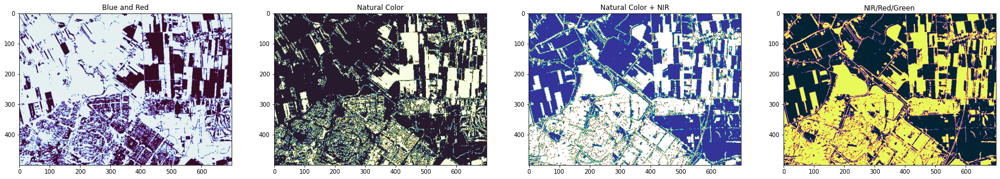

In [15]:
#Two clusters 

fig , axes = plt.subplots(nrows = 1, ncols = 4, figsize=(30,30))
plt.sca(axes[0])
plt.imshow(BR_10_2, cmap='cmo.dense')
plt.title('Blue and Red')

plt.sca(axes[1])
plt.imshow(BGR_10_2, cmap='cmo.topo')
plt.title('Natural Color')

plt.sca(axes[2])
plt.imshow(BGRNIR_10_2, cmap='terrain')
plt.title('Natural Color + NIR')


plt.sca(axes[3])
plt.imshow(veg_10_2, cmap='cmo.thermal')
plt.title('NIR/Red/Green')


Text(0.5, 1.0, &#39;NIR/Red/Green&#39;)

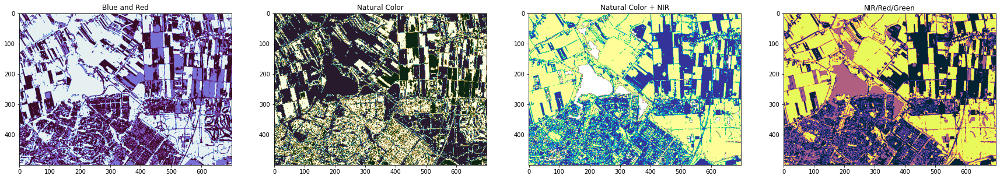

In [77]:
#Three clusters 
fig , axes = plt.subplots(nrows = 1, ncols = 4, figsize=(30,30))
plt.sca(axes[0])
plt.imshow(BR_10_3, cmap='cmo.dense')
plt.title('Blue and Red')

plt.sca(axes[1])
plt.imshow(BGR_10_3, cmap='cmo.topo')
plt.title('Natural Color')

plt.sca(axes[2])
plt.imshow(BGRNIR_10_3, cmap='terrain')
plt.title('Natural Color + NIR')

plt.sca(axes[3])
plt.imshow(veg_10_3, cmap='cmo.thermal')
plt.title('NIR/Red/Green')


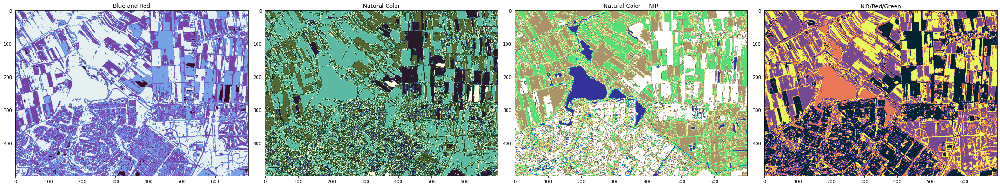

In [78]:
# Four clusters 

fig , axes = plt.subplots(nrows = 1, ncols = 4, figsize=(30,30))
plt.sca(axes[0])
plt.imshow(BR_10_4, cmap='cmo.dense')
plt.title('Blue and Red')

plt.sca(axes[1])
plt.imshow(BGR_10_4, cmap='cmo.topo')
plt.title('Natural Color')

plt.sca(axes[2])
plt.imshow(BGRNIR_10_4, cmap='terrain')
plt.title('Natural Color + NIR')

plt.sca(axes[3])
plt.imshow(veg_10_4, cmap='cmo.thermal')
plt.title('NIR/Red/Green')

fig.tight_layout()

Text(0.5, 1.0, &#39;NIR/Red/Green&#39;)

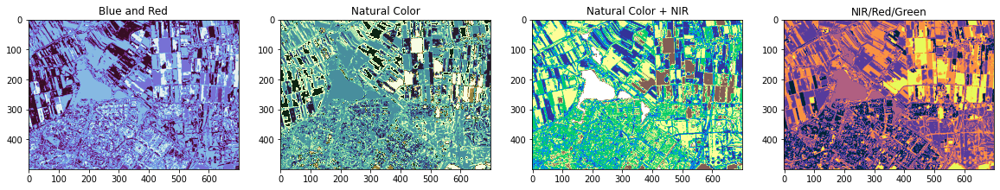

In [79]:
# Five clusters 
fig , axes = plt.subplots(nrows = 1, ncols = 4, figsize=(20,5))
plt.sca(axes[0])
plt.imshow(BR_10_5, cmap='cmo.dense')
plt.title('Blue and Red')

plt.sca(axes[1])
plt.imshow(BGR_10_5, cmap='cmo.topo')
plt.title('Natural Color')

plt.sca(axes[2])
plt.imshow(BGRNIR_10_5, cmap='terrain')
plt.title('Natural Color + NIR')

plt.sca(axes[3])
plt.imshow(veg_10_5, cmap='cmo.thermal')
plt.title('NIR/Red/Green')


Text(0.5, 1.0, &#39;NIR/Red/Green&#39;)

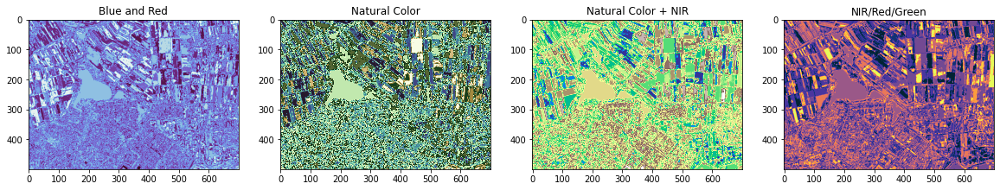

In [80]:
# Ten clusters 
fig , axes = plt.subplots(nrows = 1, ncols = 4, figsize=(20,5))
plt.sca(axes[0])
plt.imshow(BR_10_10, cmap='cmo.dense')
plt.title('Blue and Red')

plt.sca(axes[1])
plt.imshow(BGR_10_10, cmap='cmo.topo')
plt.title('Natural Color')

plt.sca(axes[2])
plt.imshow(BGRNIR_10_10, cmap='terrain')
plt.title('Natural Color + NIR')

plt.sca(axes[3])
plt.imshow(veg_10_10, cmap='cmo.thermal')
plt.title('NIR/Red/Green')
